# Modelling with Pipelines

![Status](https://img.shields.io/static/v1.svg?label=Status&message=Finished&color=green)

Pipelines in the [`scikit-learn` API](https://scikit-learn.org/stable/modules/classes.html#) allow us to sequentially apply a list of transformers and a final estimator on our dataset. Here, each intermediate step implements a `fit` and `transform` method, while the final estimator implements a `fit` method. 

This setup allows us to recursively fit of all transformations on the dataset in a single step. Moreover, the steps can be cross-validated together while setting different parameters. Another advantage of pipelines is that it allows us to organize our implementation by separating declarative from imperative code. This makes the intent of the code clear and makes it easier to debug and maintain.

```{figure} ../../img/pipelines.png
---
width: 40em
name: pipelines
---
Pipelines allow us to cleanly separate declarative from imperative code. [[source]](https://gh.mltrainings.ru/presentations/LopuhinJankiewicz_KaggleMercari.pdf)
```

In this notebook, we will look at how to create a complete pipeline in scikit-learn that performs preprocessing, feature engineering, and inference. We show that this pipeline can be fine-tuned as a whole and perform inference as is without further modification.  

## House prices dataset

Our task is to use California census data to build a model of housing prices. This data includes metrics such as the population, median income, and median housing price for each district in California. We will use mean absolute percentage error (MAPE) as our evaluation metric.

### Downloading the dataset

```{margin}
⚠️ **Attribution:** To demonstrate pipelines on an actual use case, we follow the [Chapter 2 notebook](https://github.com/ageron/handson-ml2/blob/master/02_end_to_end_machine_learning_project.ipynb) of {cite}`geron2019hands-on` released under [Apache License 2.0](https://github.com/ageron/handson-ml2/blob/master/LICENSE). But we will go a bit deeper in exploring the capabilities of pipelines for feature engineering and hyperparameter optimization. 
```


Here we download the data using the `request.urlretrieve` function from `urllib`. This function takes a URL where the data is hosted and a save path where the data will be stored on the local disk.

In [4]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import tarfile
import urllib.request

from inefficient_networks.config import config
config.set_matplotlib()
config.set_ignore_warnings()


def fetch_housing_data(housing_url, housing_path):
    '''Download data from `housing_url` and save it to `housing_path`.'''
    
    # Make directory
    os.makedirs(housing_path, exist_ok=True)
    tgz_path = os.path.join(housing_path, "housing.tgz")
    
    # Download data in housing_url to tgz_path
    urllib.request.urlretrieve(housing_url, tgz_path)
    
    # Extract tar file
    housing_tgz = tarfile.open(tgz_path)
    housing_tgz.extractall(path=housing_path)
    housing_tgz.close()

Downloading the dataset:

In [5]:
# Dataset URL
DOWNLOAD_ROOT = "https://raw.githubusercontent.com/ageron/handson-ml/master/"
HOUSING_URL = DOWNLOAD_ROOT + "datasets/housing/housing.tgz"

# Local save path
HOUSING_PATH = config.DATASET_DIR / "housing"

# Downloading the data
fetch_housing_data(HOUSING_URL, HOUSING_PATH)

### Quick look at the data

Let us load the data using pandas.

In [6]:
housing = pd.read_csv(HOUSING_PATH / "housing.csv")

print(housing.info())
housing.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB
None


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


The feature `total_bedrooms` is sometimes missing. All features are numerical except `ocean_proximity`.

In [7]:
housing.ocean_proximity.value_counts()

<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: ocean_proximity, dtype: int64

The following plot shows how median house value is generally higher near the ocean. Moreover, prices seem to depend on population density.

In [8]:
housing.plot(kind="scatter", x="longitude", y="latitude", alpha=0.4,
             s=housing["population"]/100, label="population", figsize=(10,7),
             c=housing["median_house_value"], cmap=plt.get_cmap("jet"), colorbar=True,
)
plt.legend()
plt.grid();

Looking at distribution of values. Distributions are tail-heavy; transforming the data to make it more bell-shaped may help some algorithms. Housing median age and house prices are capped.

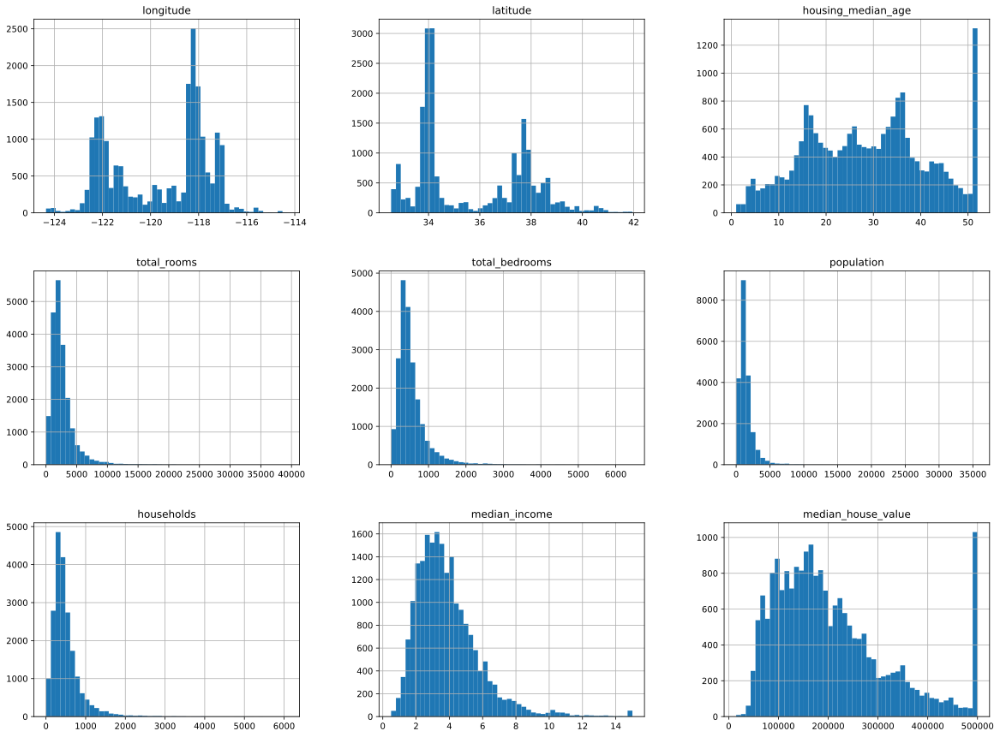

In [9]:
import matplotlib.pyplot as plt
housing.hist(bins=50, figsize=(20,15))
plt.show()

Checking for missing values:

In [10]:
housing.isna().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

## Preprocessing pipeline

In this section we create two pipelines for separate preprocessing of categorical and numerical data. These two pipelines will be combined in a single full preprocessing pipeline for the training data. First, for numerical data, we fill in missing values with the median. For the categorical feature `ocean_proximity`, we perform one-hot encoding.

In [11]:
from sklearn.impute import SimpleImputer

# Fitting the imputer on numerical fetures
housing_num = [f for f in housing.columns if f not in ['ocean_proximity', 'median_house_value']]
imputer = SimpleImputer(strategy='median')

Note that we set `categories` in the encoder since a fold during cross-validation may contain less than all possible categories, resulting in fewer columns after being transformed. 

In [12]:
from sklearn.preprocessing import OneHotEncoder

housing_cat = ['ocean_proximity']
categories = [list(housing[cat].unique()) for cat in housing_cat]
cat_encoder = OneHotEncoder(categories=categories, sparse=False)

cat_encoder.fit_transform(housing[housing_cat].iloc[:10, :])

array([[1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.]])

In [13]:
cat_encoder.categories_ # All categories even if fitted on subset of data

[array(['NEAR BAY', '<1H OCEAN', 'INLAND', 'NEAR OCEAN', 'ISLAND'],
       dtype=object)]

### Custom transformers

Although scikit-learn provides many useful transformers, we will need to write own for tasks such as custom cleanup operations or combining specific
attributes. Custom transformers work seamlessly with existing scikit-learn functionalities, all we need to do is create a class and implement three methods: `fit()` (that returns `self`) and `transform()` (we get `fit_transform` for free from the `TransformerMixin` as a base class). If we add `BaseEstimator` as a base class, we will also get two extra methods `get_params()` and `set_params()` that will be useful for automatic hyperparameter tuning. Here we create a transformer for adding new features.

In [14]:
from sklearn.base import BaseEstimator, TransformerMixin

class CombinedFeaturesAdder(BaseEstimator, TransformerMixin):
    """Transformer for adding feature combinations discussed above."""
    
    def __init__(self, add_bedrooms_per_room=False): # No *args, **kwargs (!)
        self.add_bedrooms_per_room = add_bedrooms_per_room
        
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        X = X.copy()
        rooms_per_household = X["total_rooms"] / X["households"]
        population_per_household = X["population"] / X["households"]
        X["rooms_per_household"] = rooms_per_household
        X["population_per_household"] = population_per_household
        
        if self.add_bedrooms_per_room:
            bedrooms_per_room = X["total_bedrooms"] / X["total_rooms"]
            X["bedrooms_per_room"] = bedrooms_per_room
        
        return X

In this example the transformer has one hyperparameter, `add_bedrooms_per_room`,
set to `False` by default (we don't want the default behavior to change the column count). This hyperparameter will allow us to easily find out whether adding this attribute helps the
ML algorithms or not.

In [15]:
feature_adder = CombinedFeaturesAdder(add_bedrooms_per_room=True)
housing_extra_features = feature_adder.transform(housing)

Checking the shapes, the `feature_adder` should add two columns to the feature set.

In [16]:
print(housing.shape)
print(housing_extra_features.shape)
housing_extra_features.head()

(20640, 10)
(20640, 13)


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,rooms_per_household,population_per_household,bedrooms_per_room
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,6.984127,2.555556,0.146591
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,6.238137,2.109842,0.155797
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,8.288136,2.802260,0.129516
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,5.817352,2.547945,0.184458
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,6.281853,2.181467,0.172096


### Arranging the pipeline

The `Pipeline` constructor takes a list of name estimator pairs defining a sequence of steps. All but the last estimator must be transformers (i.e. they must have a `fit_transform()` method). The names can be anything as long as they are unique and don't contain double underscores. Calling the pipeline's `fit()` method calls `fit_transform()` sequentially on all transformers, passing the output of each call as the parameter to the next call until it reaches the final estimator, for which it calls the `fit()` method.

The pipeline exposes the same methods as the final estimator. For our preprocessing pipeline, the last estimator is a `StandardScaler` is a transformer, so the pipeline has a `transform` method that applies all the transforms to the data in sequence.

In [17]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer


# Feature transformation pipeline
cat_feat = ['ocean_proximity']
num_feat = [f for f in housing.columns if f not in cat_feat + ['median_house_value']]

feature_pipe = ColumnTransformer(
    [
        (
            'num', 
            Pipeline([
                ('feature_adder', CombinedFeaturesAdder()),
                ('imputer', SimpleImputer(strategy='median')),
                ('std_scaler', StandardScaler()),    
            ]), 
            num_feat
        ),
        (
            'cat', 
            Pipeline([
                ('one_hot', OneHotEncoder(categories=categories, sparse=False))
            ]), 
            cat_feat
        )
    ],
    remainder='drop' # Columns not in num_feat + cat_feat are dropped.
)

# Preprocessed dataset
housing_transformed = feature_pipe.fit_transform(housing)
housing_transformed.shape

(20640, 15)

## Fine tuning the pipeline

Instead of tuning a single model using transformed data, we will tune the pipeline end-to-end using `optuna`.

In [24]:
import optuna
from functools import partial
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score


def create_pipe(params: dict):
    """Create end-to-end pipeline from parameter dictionary."""

    cat_feat = ['ocean_proximity']
    num_feat = [f for f in housing.columns if f not in cat_feat + ['median_house_value']]

    feature_pipe = ColumnTransformer(
        [(
            'num', 
            Pipeline([
                ('feature_adder', CombinedFeaturesAdder(params['add_bpr'])),
                ('imputer', SimpleImputer(strategy='median')),
                ('std_scaler', StandardScaler()),    
            ]), 
            num_feat
        ),
        (
            'cat', 
            Pipeline([
                ('one_hot', OneHotEncoder(categories=categories, sparse=False))
            ]), 
            cat_feat
        )],
        remainder='drop' # Columns not in num_feat + cat_feat are dropped.
    )

    model = RandomForestRegressor(
        max_depth=params['max_depth'],
        n_estimators=params['n_estimators'],
    )

    return Pipeline([("prep", feature_pipe), ("model", model)])


def objective(trial, X, y):
    # Define search space
    params = {
        'add_bpr': trial.suggest_categorical('add_bpr', [True, False]), 
        'n_estimators': trial.suggest_int('n_estimators', 200, 1000),
        'max_depth': trial.suggest_int('max_depth', 5, 35),
    }

    pipe = create_pipe(params)
    score = cross_val_score(pipe, X, y, cv=5, scoring='neg_mean_squared_error')
    return score.mean()


# Create study
X = housing.drop(['median_house_value'], axis=1)
y = housing.median_house_value.values
study = optuna.create_study(direction="maximize")
study.optimize(partial(objective, X=X, y=y), n_trials=30, n_jobs=-1)

[I 2022-03-30 23:02:35,526] A new study created in memory with name: no-name-fc528f8b-6d98-49fe-8191-5ffb5b2a7188
[I 2022-03-30 23:04:44,321] Trial 4 finished with value: -4861228295.164042 and parameters: {'add_bpr': True, 'n_estimators': 243, 'max_depth': 9}. Best is trial 4 with value: -4861228295.164042.
[I 2022-03-30 23:05:45,141] Trial 5 finished with value: -4888259084.179206 and parameters: {'add_bpr': True, 'n_estimators': 224, 'max_depth': 17}. Best is trial 4 with value: -4861228295.164042.
[I 2022-03-30 23:06:05,253] Trial 2 finished with value: -5022913322.46348 and parameters: {'add_bpr': False, 'n_estimators': 682, 'max_depth': 5}. Best is trial 4 with value: -4861228295.164042.
[I 2022-03-30 23:08:56,514] Trial 8 finished with value: -4847378267.785907 and parameters: {'add_bpr': False, 'n_estimators': 347, 'max_depth': 13}. Best is trial 8 with value: -4847378267.785907.
[I 2022-03-30 23:11:22,538] Trial 0 finished with value: -4826693844.655875 and parameters: {'add_b

In [25]:
print("\nBest trial:")
best_trial = study.best_trial

print("  Number:", best_trial.number)
print("  Value: ", best_trial.value)
print("  Params: ")
for key, value in best_trial.params.items():
    print("    {}: {}".format(key, value))


Best trial:
  Number: 13
  Value:  -4767244016.885362
  Params: 
    add_bpr: True
    n_estimators: 236
    max_depth: 6


Observe that `add_bedrooms_per_room=True` so adding the extra feature is the best choice. In fact this is the choice for most top scoring trials. This shows that even preprocessing steps can be optimized as a hyperparameter of the pipeline.

In [36]:
study.trials_dataframe().sort_values("value", ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_add_bpr,params_max_depth,params_n_estimators,state
13,13,-4.767244e+09,2022-03-30 23:13:10.544589,2022-03-30 23:15:07.714538,0 days 00:01:57.169949,True,6,236,COMPLETE
14,14,-4.806753e+09,2022-03-30 23:13:34.364237,2022-03-30 23:20:00.949083,0 days 00:06:26.584846,True,22,341,COMPLETE
7,7,-4.809619e+09,2022-03-30 23:02:35.568442,2022-03-30 23:14:15.220781,0 days 00:11:39.652339,True,15,755,COMPLETE
23,23,-4.812690e+09,2022-03-30 23:21:41.716374,2022-03-30 23:32:22.674971,0 days 00:10:40.958597,True,24,465,COMPLETE
16,16,-4.817066e+09,2022-03-30 23:14:33.825513,2022-03-30 23:34:14.253507,0 days 00:19:40.427994,False,30,983,COMPLETE
1,1,-4.821094e+09,2022-03-30 23:02:35.542003,2022-03-30 23:17:52.413960,0 days 00:15:16.871957,True,31,816,COMPLETE
24,24,-4.822443e+09,2022-03-30 23:22:00.875633,2022-03-30 23:45:23.800490,0 days 00:23:22.924857,True,24,985,COMPLETE
29,29,-4.823189e+09,2022-03-30 23:37:33.261343,2022-03-30 23:47:24.597743,0 days 00:09:51.336400,True,35,528,COMPLETE
18,18,-4.823540e+09,2022-03-30 23:15:07.723930,2022-03-30 23:35:11.508089,0 days 00:20:03.784159,True,22,921,COMPLETE
20,20,-4.823554e+09,2022-03-30 23:16:06.971610,2022-03-30 23:37:33.098435,0 days 00:21:26.126825,True,23,950,COMPLETE


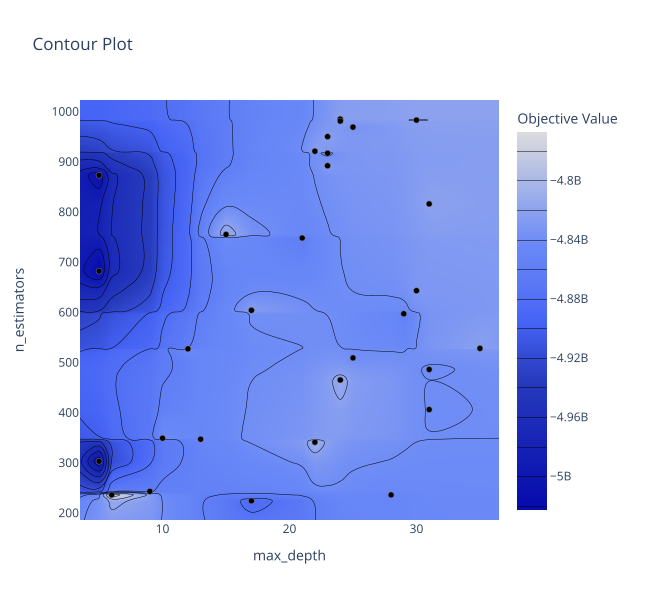

In [37]:
fig = optuna.visualization.plot_contour(study, params=["max_depth", "n_estimators"])
fig.update_layout(width=650, height=600)
fig.show(renderer="svg")

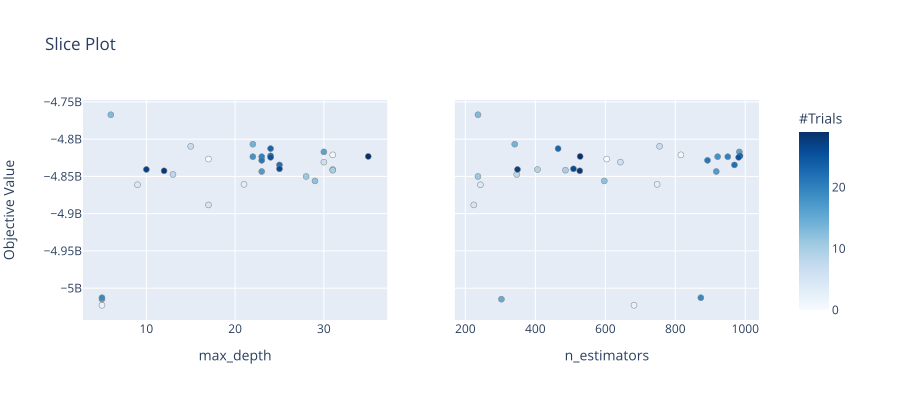

In [38]:
fig = optuna.visualization.plot_slice(study, ["max_depth", "n_estimators"])
fig.update_layout(width=900, height=400)
fig.show(renderer="svg")

## Inference with the pipeline

Assuming the test data is identical to train data, any trained pipeline can be used for inference without any specific preprocessing steps.

In [58]:
from sklearn.metrics import mean_squared_error

# Fit on best parameters
best_pipe = create_pipe(study.best_params)
best_pipe.fit(X, y)

# Make inference / prediction
y_pred = best_pipe.predict(X)
print('RMSE (train):', np.sqrt(mean_squared_error(y, y_pred)))

RMSE (train): 58431.08973342668


## Conclusion

Pipelines are **awesome**. We can use scikit-learn transformers as well as define custom transformers as steps in the pipeline, making this technique very flexible. For example, even preprocessing can be included in the pipeline, and therefore be part of cross-validation and hyperparameter optimization. Finally, we have shown that the pipeline can be loaded to perform inference directly on new test data with minimal preprocessing. This means that testing, development, and maintenance can be done in one place in the code.